In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas import Series
import seaborn as sns
import datetime
import random
pd.set_option("display.max_columns",None) #show all columns
pd.set_option("display.max_rows",None) #show all rows

In [122]:
#import data into two table
#data 1 is Claimant_final
#data 2 is Claim_final
data_1 = pd.read_csv("Claim_final.csv")# ,encoding = "utf-8")
data_2 = pd.read_csv("Claimant_final.csv")#encoding ="utf-8")
data = data_1.merge(data_2)
data = pd.DataFrame(data)
data.drop(["CLM_NBR","POL_NBR","VEH_COLR_TXT"],axis = 1)
data


,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT
0,0,YB85Q6L,1,2,5/29/2018,903.0,1522,991120685,NY,6/22/1960,Multi Veh - Unclear Liab,Closed with Payment,1,BURGANDY,"D/S FRONT FENDER, D",F-350 SUPE,2003,Automobile,Driver Front Corner,None,Below 10 mph
1,1,VUC6B3X,1,2,11/28/2016,0.0,10093,993950729,FL,12/1/1944,Multi Veh - Unclear Liab,Closed with Payment,2,BLACK,UNK REAR DMG,SONATA HYB,2016,Automobile,Complete Rear End,None,Parked or Stopped
2,6,EKICR4W,1,1,5/10/2018,156.0,75055,998685688,SC,6/10/1972,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,POI: D/S DOOR WON'T,200 LX,2016,Automobile,Driver Center,None,10-20 mph
3,12,Y9TIRJH,2,1,12/11/2019,0.0,5576,994335003,FL,3/20/1988,Multi Veh - Clear Liab,Closed without Payment,1,SILVER,NONE,COROLLA CE,2007,Automobile,No Damage,None,21-50 mph
4,16,YZKNJDD,1,3,7/7/2018,9129.0,13133,996569175,FL,9/15/1949,Multi Veh - Unclear Liab,Closed with Payment,2,BLUE,PRIMARY POINT OF DA,F-150 SUPE,2009,Automobile,Complete Front End,One,Unknown
5,25,X0STU9Z,4,2,6/9/2018,0.0,16298,997863143,PA,8/2/1948,Multi Veh - Unclear Liab,Closed with Payment,1,Silver,"FRONT BUMPER, GRILL",OUTBACK 3.,2011,Automobile,Complete Front End,None,Unknown
6,31,CBH7XVD,1,3,10/15/2018,6286.0,143767,994326201,NC,2/7/2007,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK GLASS IS OUT -,SRX PREMIU,2016,Automobile,Driver Rear Corner,None,Unknown
7,43,X8LZHG1,1,2,6/29/2015,521.0,82055,996167195,NY,8/3/1985,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE,PS REAR 1/4 PANEL W,TC,2005,Automobile,Complete Front End,More than one,21-50 mph
8,49,TKYJ2PM,1,1,6/14/2018,0.0,11930,992365054,IL,3/16/1985,Single Veh,Closed with Payment,2,BLUE,ENTIRE P/S AND FRON,YUKON SLE/,2003,Automobile,Complete Passenger Side,One,21-50 mph
9,51,910W8X5,1,1,9/7/2018,0.0,10536,994262222,ME,8/6/1948,Multi Veh - Unclear Liab,Closed with Payment,2,GRAY,"D/S FRNOT QP, HEADL",LEGACY 2.5,2012,Automobile,Driver Front Corner,None,10-20 mph


In [123]:
data["COV_RGST_DT"] = pd.to_datetime(data["COV_RGST_DT"])
data["PRI_BTH_DT"] = pd.to_datetime(data["PRI_BTH_DT"]) # convertion of time frame
print(type(data["COV_RGST_DT"]))# still in series 
print(type(data["PRI_BTH_DT"]))
data["age"]= data["COV_RGST_DT"].dt.year - data["PRI_BTH_DT"].dt.year
#data = pd.DataFrame(data)
data

<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>


,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
0,0,YB85Q6L,1,2,2018-05-29,903.0,1522,991120685,NY,1960-06-22,Multi Veh - Unclear Liab,Closed with Payment,1,BURGANDY,"D/S FRONT FENDER, D",F-350 SUPE,2003,Automobile,Driver Front Corner,None,Below 10 mph,58
1,1,VUC6B3X,1,2,2016-11-28,0.0,10093,993950729,FL,1944-12-01,Multi Veh - Unclear Liab,Closed with Payment,2,BLACK,UNK REAR DMG,SONATA HYB,2016,Automobile,Complete Rear End,None,Parked or Stopped,72
2,6,EKICR4W,1,1,2018-05-10,156.0,75055,998685688,SC,1972-06-10,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,POI: D/S DOOR WON'T,200 LX,2016,Automobile,Driver Center,None,10-20 mph,46
3,12,Y9TIRJH,2,1,2019-12-11,0.0,5576,994335003,FL,1988-03-20,Multi Veh - Clear Liab,Closed without Payment,1,SILVER,NONE,COROLLA CE,2007,Automobile,No Damage,None,21-50 mph,31
4,16,YZKNJDD,1,3,2018-07-07,9129.0,13133,996569175,FL,1949-09-15,Multi Veh - Unclear Liab,Closed with Payment,2,BLUE,PRIMARY POINT OF DA,F-150 SUPE,2009,Automobile,Complete Front End,One,Unknown,69
5,25,X0STU9Z,4,2,2018-06-09,0.0,16298,997863143,PA,1948-08-02,Multi Veh - Unclear Liab,Closed with Payment,1,Silver,"FRONT BUMPER, GRILL",OUTBACK 3.,2011,Automobile,Complete Front End,None,Unknown,70
6,31,CBH7XVD,1,3,2018-10-15,6286.0,143767,994326201,NC,2007-02-07,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK GLASS IS OUT -,SRX PREMIU,2016,Automobile,Driver Rear Corner,None,Unknown,11
7,43,X8LZHG1,1,2,2015-06-29,521.0,82055,996167195,NY,1985-08-03,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE,PS REAR 1/4 PANEL W,TC,2005,Automobile,Complete Front End,More than one,21-50 mph,30
8,49,TKYJ2PM,1,1,2018-06-14,0.0,11930,992365054,IL,1985-03-16,Single Veh,Closed with Payment,2,BLUE,ENTIRE P/S AND FRON,YUKON SLE/,2003,Automobile,Complete Passenger Side,One,21-50 mph,33
9,51,910W8X5,1,1,2018-09-07,0.0,10536,994262222,ME,1948-08-06,Multi Veh - Unclear Liab,Closed with Payment,2,GRAY,"D/S FRNOT QP, HEADL",LEGACY 2.5,2012,Automobile,Driver Front Corner,None,10-20 mph,70


In [124]:
data = data.drop(data[data["age"] > 14].index)
data


,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
6,31,CBH7XVD,1,3,2018-10-15,6286.0,143767,994326201,NC,2007-02-07,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK GLASS IS OUT -,SRX PREMIU,2016,Automobile,Driver Rear Corner,None,Unknown,11
13,67,A3ROXGM,1,2,2018-04-11,0.0,1985,997059601,MD,2014-12-04,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE ORCHID T,REAR BUMEPR DAMAGE.,ACCORD SPO,2015,Automobile,Complete Rear End,None,Parked or Stopped,4
73,397,9W5RIA4,2,2,2017-06-12,0.0,39454,996619094,FL,2005-09-29,Multi Veh - Unclear Liab,Closed without Payment,1,Blue,F/E BUMPER DMGS,RAM PICKUP,2006,Automobile,Complete Front End,None,Unknown,12
77,416,EZ27RSU,2,5,2018-08-06,2180.0,56082,993611581,FL,2004-08-21,Multi Veh - Unclear Liab,Closed with Payment,2,GOLD,"HEAVY F/E DMG, FLUI",ACADIA SLT,2013,Automobile,Complete Front End,None,21-50 mph,14
83,472,E5Q22PP,1,3,2018-12-09,0.0,15721,990580979,TX,2016-04-07,Multi Veh - Unclear Liab,Closed without Payment,0,WHITE,PRIMARY POINT OF DA,SILVERADO,2002,Automobile,Passenger Center,None,Below 10 mph,2
93,532,QAULVZE,4,4,2019-07-05,0.0,13660,996080647,CO,2007-02-11,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK BUMPER DRAGGIN,EQUINOX LT,2017,Automobile,Complete Rear End,None,Below 10 mph,12
123,649,YB6XOCC,1,1,2018-09-20,0.0,2526,991051544,CO,2010-11-06,Multi Veh - Unclear Liab,Closed with Payment,1,SLATE,NO VISIBLE DMG,TRAVERSE 2,2011,Automobile,Complete Front End,None,Unknown,8
125,660,6QXIUBM,1,2,2016-07-02,0.0,5370,999054715,NC,2006-10-26,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,FRONT END DAMAGES-,EQUINOX LT,2005,Automobile,Complete Front End,None,21-50 mph,10
204,1040,Y6ZIY8Y,1,4,2013-12-26,0.0,4000,994120215,NC,2010-05-04,Multi Veh - Unclear Liab,Closed with Payment,1,RED,POI: P/S F LIGHT BU,ODYSSEY EX,2003,Automobile,Passenger Front Corner,More than one,21-50 mph,3
214,1088,DRSOIBW,1,6,2015-08-19,11006.0,238492,995689563,SC,2007-11-14,Multi Veh - Unclear Liab,Closed without Payment,1,UNKNOWN,POI/DMG UNKNOWN,SL2,2001,Automobile,Driver Front Corner,None,Unknown,8


In [126]:
closed_without_pay = data[data["CLAIMANT_STATUS"] =="Closed without Payment"]
closed_without_pay.count()

Unnamed: 0                  16
CLM_NBR                     16
NBR_OF_CLMT                 16
BI_CLMT_CNT                 16
COV_RGST_DT                 16
CLAIM_EXPENSE_EST_AMT       16
CLAIM_INDEMNITY_EST_AMT     16
POL_NBR                     16
POLICY_STATE                16
PRI_BTH_DT                  16
AUTO_ACCIDENT_DESC          16
CLAIMANT_STATUS             16
APPR_DAM_EST_REC_CNT        16
VEH_COLR_TXT                16
VEH_DAM_TXT                 16
CLMT_VEH_MDL_NM             16
CLMT_VEH_YR                 16
VEH_TYPE                    16
VEH_PRIMARY_PT_OF_DAMAGE    16
AIRBAG_DEPLOYED             16
VEH_SPEED_AT_IMPACT         16
age                         16
dtype: int64

In [127]:
closed_with_pay = data[data["CLAIMANT_STATUS"] =="Closed with Payment"]
closed_with_pay.count()

Unnamed: 0                  50
CLM_NBR                     50
NBR_OF_CLMT                 50
BI_CLMT_CNT                 50
COV_RGST_DT                 50
CLAIM_EXPENSE_EST_AMT       50
CLAIM_INDEMNITY_EST_AMT     50
POL_NBR                     50
POLICY_STATE                50
PRI_BTH_DT                  50
AUTO_ACCIDENT_DESC          50
CLAIMANT_STATUS             50
APPR_DAM_EST_REC_CNT        50
VEH_COLR_TXT                50
VEH_DAM_TXT                 50
CLMT_VEH_MDL_NM             50
CLMT_VEH_YR                 50
VEH_TYPE                    50
VEH_PRIMARY_PT_OF_DAMAGE    50
AIRBAG_DEPLOYED             50
VEH_SPEED_AT_IMPACT         50
age                         50
dtype: int64

In [128]:
young_age = data[data["age"] < 14]
young_age

,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
6,31,CBH7XVD,1,3,2018-10-15,6286.0,143767,994326201,NC,2007-02-07,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK GLASS IS OUT -,SRX PREMIU,2016,Automobile,Driver Rear Corner,None,Unknown,11
13,67,A3ROXGM,1,2,2018-04-11,0.0,1985,997059601,MD,2014-12-04,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE ORCHID T,REAR BUMEPR DAMAGE.,ACCORD SPO,2015,Automobile,Complete Rear End,None,Parked or Stopped,4
73,397,9W5RIA4,2,2,2017-06-12,0.0,39454,996619094,FL,2005-09-29,Multi Veh - Unclear Liab,Closed without Payment,1,Blue,F/E BUMPER DMGS,RAM PICKUP,2006,Automobile,Complete Front End,None,Unknown,12
83,472,E5Q22PP,1,3,2018-12-09,0.0,15721,990580979,TX,2016-04-07,Multi Veh - Unclear Liab,Closed without Payment,0,WHITE,PRIMARY POINT OF DA,SILVERADO,2002,Automobile,Passenger Center,None,Below 10 mph,2
93,532,QAULVZE,4,4,2019-07-05,0.0,13660,996080647,CO,2007-02-11,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK BUMPER DRAGGIN,EQUINOX LT,2017,Automobile,Complete Rear End,None,Below 10 mph,12
123,649,YB6XOCC,1,1,2018-09-20,0.0,2526,991051544,CO,2010-11-06,Multi Veh - Unclear Liab,Closed with Payment,1,SLATE,NO VISIBLE DMG,TRAVERSE 2,2011,Automobile,Complete Front End,None,Unknown,8
125,660,6QXIUBM,1,2,2016-07-02,0.0,5370,999054715,NC,2006-10-26,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,FRONT END DAMAGES-,EQUINOX LT,2005,Automobile,Complete Front End,None,21-50 mph,10
204,1040,Y6ZIY8Y,1,4,2013-12-26,0.0,4000,994120215,NC,2010-05-04,Multi Veh - Unclear Liab,Closed with Payment,1,RED,POI: P/S F LIGHT BU,ODYSSEY EX,2003,Automobile,Passenger Front Corner,More than one,21-50 mph,3
214,1088,DRSOIBW,1,6,2015-08-19,11006.0,238492,995689563,SC,2007-11-14,Multi Veh - Unclear Liab,Closed without Payment,1,UNKNOWN,POI/DMG UNKNOWN,SL2,2001,Automobile,Driver Front Corner,None,Unknown,8
237,1213,QRY6A0W,1,2,2015-05-20,0.0,232,992280160,NY,2002-12-19,Single Veh,Closed without Payment,0,SILVER,POI: NONE,SEDONA LX/,2006,Automobile,No Damage,None,Parked or Stopped,13


In [133]:
closed_without_pay = data[data["CLAIMANT_STATUS"] =="Closed without Payment"]
closed_without_pay

,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
13,67,A3ROXGM,1,2,2018-04-11,0.0,1985,997059601,MD,2014-12-04,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE ORCHID T,REAR BUMEPR DAMAGE.,ACCORD SPO,2015,Automobile,Complete Rear End,None,Parked or Stopped,4
73,397,9W5RIA4,2,2,2017-06-12,0.0,39454,996619094,FL,2005-09-29,Multi Veh - Unclear Liab,Closed without Payment,1,Blue,F/E BUMPER DMGS,RAM PICKUP,2006,Automobile,Complete Front End,None,Unknown,12
83,472,E5Q22PP,1,3,2018-12-09,0.0,15721,990580979,TX,2016-04-07,Multi Veh - Unclear Liab,Closed without Payment,0,WHITE,PRIMARY POINT OF DA,SILVERADO,2002,Automobile,Passenger Center,None,Below 10 mph,2
214,1088,DRSOIBW,1,6,2015-08-19,11006.0,238492,995689563,SC,2007-11-14,Multi Veh - Unclear Liab,Closed without Payment,1,UNKNOWN,POI/DMG UNKNOWN,SL2,2001,Automobile,Driver Front Corner,None,Unknown,8
237,1213,QRY6A0W,1,2,2015-05-20,0.0,232,992280160,NY,2002-12-19,Single Veh,Closed without Payment,0,SILVER,POI: NONE,SEDONA LX/,2006,Automobile,No Damage,None,Parked or Stopped,13
341,1737,1HKW6LX,3,2,2019-12-30,0.0,10622,997696103,TX,2016-12-11,Multi Veh - Unclear Liab,Closed without Payment,0,GRAY,BUMPER BROKEN,F-150,1995,Automobile,Complete Front End,Unknown,Unknown,3
674,3666,4U3D9Q9,1,4,2017-09-25,0.0,1953,998822851,SC,2005-07-11,Multi Veh - Unclear Liab,Closed without Payment,1,RED,REAR BUMPER AND TAI,GRAND CARA,2011,Automobile,Complete Rear End,None,Parked or Stopped,12
682,3701,EW5N81H,2,2,2018-08-17,0.0,3963,997999080,WA,2018-01-06,Multi Veh - Unclear Liab,Closed without Payment,1,Silver,BUMPER CAME OFF,SONATA GLS,2014,Automobile,Complete Rear End,None,Parked or Stopped,0
718,3923,ZQR3PM2,4,4,2014-09-05,0.0,100272,991077839,GA,2011-02-02,Multi Veh - Unclear Liab,Closed without Payment,1,SILVER,POI:R/E PUSHED IN F,4RUNNER LI,2003,Automobile,Complete Rear End,None,Parked or Stopped,3
968,5370,CVBKJV0,1,2,2020-03-08,0.0,700,998412664,PA,2017-02-22,Single Veh,Closed without Payment,1,DK GRAY,NONE,TRAX LT,2017,Automobile,No Damage,None,10-20 mph,3


In [134]:
saved_money1 = data["CLAIM_INDEMNITY_EST_AMT"]
li = []
def money(saved_money1):
    for x in saved_money1:
        if x != 0:
            li.append(x)
    return sum(li)
print(money(saved_money1))


1866483


In [104]:
old_age =  data[data["age"] > 14].count()
old_age

Unnamed: 0                  1506
CLM_NBR                     1506
NBR_OF_CLMT                 1506
BI_CLMT_CNT                 1506
COV_RGST_DT                 1506
CLAIM_EXPENSE_EST_AMT       1492
CLAIM_INDEMNITY_EST_AMT     1506
POL_NBR                     1506
POLICY_STATE                1488
PRI_BTH_DT                  1506
AUTO_ACCIDENT_DESC          1506
CLAIMANT_STATUS             1506
APPR_DAM_EST_REC_CNT        1506
VEH_COLR_TXT                1492
VEH_DAM_TXT                 1506
CLMT_VEH_MDL_NM             1506
CLMT_VEH_YR                 1506
VEH_TYPE                    1506
VEH_PRIMARY_PT_OF_DAMAGE    1506
AIRBAG_DEPLOYED             1506
VEH_SPEED_AT_IMPACT         1506
age                         1506
dtype: int64

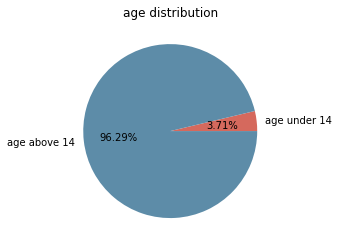

In [105]:
y = np.array([58,1506])

plt.pie(y,
        labels=["age under 14", "age above 14"], 
        colors=["#d5695d", "#5d8ca8"], 
        explode=(0, 0), 
        autopct='%.2f%%', 
       )
plt.title("age distribution")
plt.show()

In [108]:
closed_with_pay = data[data["CLAIMANT_STATUS"] =="Closed with Payment"]
closed_with_pay.count()

Unnamed: 0                  1121
CLM_NBR                     1121
NBR_OF_CLMT                 1121
BI_CLMT_CNT                 1121
COV_RGST_DT                 1121
CLAIM_EXPENSE_EST_AMT       1111
CLAIM_INDEMNITY_EST_AMT     1121
POL_NBR                     1121
POLICY_STATE                1108
PRI_BTH_DT                  1121
AUTO_ACCIDENT_DESC          1121
CLAIMANT_STATUS             1121
APPR_DAM_EST_REC_CNT        1121
VEH_COLR_TXT                1110
VEH_DAM_TXT                 1121
CLMT_VEH_MDL_NM             1121
CLMT_VEH_YR                 1121
VEH_TYPE                    1121
VEH_PRIMARY_PT_OF_DAMAGE    1121
AIRBAG_DEPLOYED             1121
VEH_SPEED_AT_IMPACT         1121
age                         1121
dtype: int64

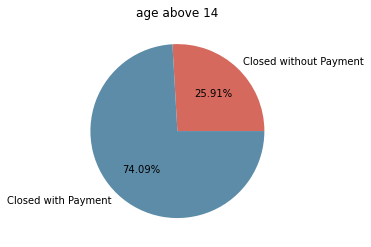

In [109]:
y = np.array([392,1121])

plt.pie(y,
        labels=["Closed without Payment", "Closed with Payment"], 
        colors=["#d5695d", "#5d8ca8"], 
        explode=(0, 0), 
        autopct='%.2f%%', 
       )
plt.title("age above 14")
plt.show()

In [94]:
data = data.drop(data[data["age"] > 14].index)
data



,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
6,31,CBH7XVD,1,3,2018-10-15,6286.0,143767,994326201,NC,2007-02-07,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK GLASS IS OUT -,SRX PREMIU,2016,Automobile,Driver Rear Corner,None,Unknown,11
13,67,A3ROXGM,1,2,2018-04-11,0.0,1985,997059601,MD,2014-12-04,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE ORCHID T,REAR BUMEPR DAMAGE.,ACCORD SPO,2015,Automobile,Complete Rear End,None,Parked or Stopped,4
73,397,9W5RIA4,2,2,2017-06-12,0.0,39454,996619094,FL,2005-09-29,Multi Veh - Unclear Liab,Closed without Payment,1,Blue,F/E BUMPER DMGS,RAM PICKUP,2006,Automobile,Complete Front End,None,Unknown,12
77,416,EZ27RSU,2,5,2018-08-06,2180.0,56082,993611581,FL,2004-08-21,Multi Veh - Unclear Liab,Closed with Payment,2,GOLD,"HEAVY F/E DMG, FLUI",ACADIA SLT,2013,Automobile,Complete Front End,None,21-50 mph,14
83,472,E5Q22PP,1,3,2018-12-09,0.0,15721,990580979,TX,2016-04-07,Multi Veh - Unclear Liab,Closed without Payment,0,WHITE,PRIMARY POINT OF DA,SILVERADO,2002,Automobile,Passenger Center,None,Below 10 mph,2
93,532,QAULVZE,4,4,2019-07-05,0.0,13660,996080647,CO,2007-02-11,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK BUMPER DRAGGIN,EQUINOX LT,2017,Automobile,Complete Rear End,None,Below 10 mph,12
123,649,YB6XOCC,1,1,2018-09-20,0.0,2526,991051544,CO,2010-11-06,Multi Veh - Unclear Liab,Closed with Payment,1,SLATE,NO VISIBLE DMG,TRAVERSE 2,2011,Automobile,Complete Front End,None,Unknown,8
125,660,6QXIUBM,1,2,2016-07-02,0.0,5370,999054715,NC,2006-10-26,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,FRONT END DAMAGES-,EQUINOX LT,2005,Automobile,Complete Front End,None,21-50 mph,10
204,1040,Y6ZIY8Y,1,4,2013-12-26,0.0,4000,994120215,NC,2010-05-04,Multi Veh - Unclear Liab,Closed with Payment,1,RED,POI: P/S F LIGHT BU,ODYSSEY EX,2003,Automobile,Passenger Front Corner,More than one,21-50 mph,3
214,1088,DRSOIBW,1,6,2015-08-19,11006.0,238492,995689563,SC,2007-11-14,Multi Veh - Unclear Liab,Closed without Payment,1,UNKNOWN,POI/DMG UNKNOWN,SL2,2001,Automobile,Driver Front Corner,None,Unknown,8


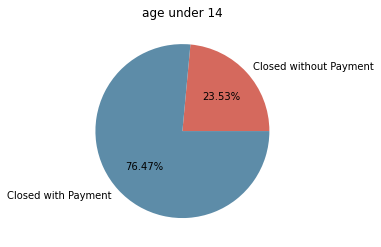

In [98]:
y = np.array([16,52])

plt.pie(y,
        labels=["Closed without Payment", "Closed with Payment"], 
        colors=["#d5695d", "#5d8ca8"], 
        explode=(0, 0), 
        autopct='%.2f%%', 
       )
plt.title("age under 14")
plt.show()

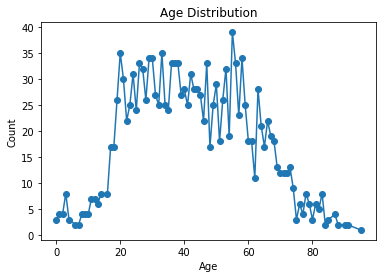

In [79]:
age = data["age"]
# 将ages列表转换成pandas的Series对象
age_series = pd.Series(age)

# 使用pandas的value_counts()方法统计每个年龄出现的次数
age_counts = age_series.value_counts().sort_index()

# 绘制折线图
plt.plot(age_counts.index, age_counts.values, '-o')
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age Distribution')
plt.show()

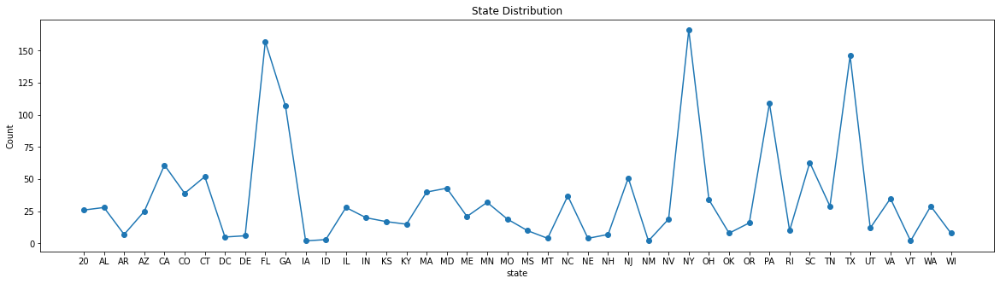

In [95]:
state = data["POLICY_STATE"]
state_series = pd.Series(state)
plt.figure(figsize=(20,5))
state_counts = state_series.value_counts().sort_index()
plt.plot(state_counts.index, state_counts.values, '-o')
plt.xlabel("state")
plt.ylabel("Count")
plt.title("State Distribution")
plt.show()

In [50]:
#loc all the info with age below 14; check if age 14 with payment status
young_kid = data[data["age"] < 14]
young_kid

,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
6,31,CBH7XVD,1,3,2018-10-15,6286.0,143767,994326201,NC,2007-02-07,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK GLASS IS OUT -,SRX PREMIU,2016,Automobile,Driver Rear Corner,None,Unknown,11
13,67,A3ROXGM,1,2,2018-04-11,0.0,1985,997059601,MD,2014-12-04,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE ORCHID T,REAR BUMEPR DAMAGE.,ACCORD SPO,2015,Automobile,Complete Rear End,None,Parked or Stopped,4
73,397,9W5RIA4,2,2,2017-06-12,0.0,39454,996619094,FL,2005-09-29,Multi Veh - Unclear Liab,Closed without Payment,1,Blue,F/E BUMPER DMGS,RAM PICKUP,2006,Automobile,Complete Front End,None,Unknown,12
83,472,E5Q22PP,1,3,2018-12-09,0.0,15721,990580979,TX,2016-04-07,Multi Veh - Unclear Liab,Closed without Payment,0,WHITE,PRIMARY POINT OF DA,SILVERADO,2002,Automobile,Passenger Center,None,Below 10 mph,2
93,532,QAULVZE,4,4,2019-07-05,0.0,13660,996080647,CO,2007-02-11,Multi Veh - Unclear Liab,Closed with Payment,2,WHITE,BACK BUMPER DRAGGIN,EQUINOX LT,2017,Automobile,Complete Rear End,None,Below 10 mph,12
123,649,YB6XOCC,1,1,2018-09-20,0.0,2526,991051544,CO,2010-11-06,Multi Veh - Unclear Liab,Closed with Payment,1,SLATE,NO VISIBLE DMG,TRAVERSE 2,2011,Automobile,Complete Front End,None,Unknown,8
125,660,6QXIUBM,1,2,2016-07-02,0.0,5370,999054715,NC,2006-10-26,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,FRONT END DAMAGES-,EQUINOX LT,2005,Automobile,Complete Front End,None,21-50 mph,10
204,1040,Y6ZIY8Y,1,4,2013-12-26,0.0,4000,994120215,NC,2010-05-04,Multi Veh - Unclear Liab,Closed with Payment,1,RED,POI: P/S F LIGHT BU,ODYSSEY EX,2003,Automobile,Passenger Front Corner,More than one,21-50 mph,3
214,1088,DRSOIBW,1,6,2015-08-19,11006.0,238492,995689563,SC,2007-11-14,Multi Veh - Unclear Liab,Closed without Payment,1,UNKNOWN,POI/DMG UNKNOWN,SL2,2001,Automobile,Driver Front Corner,None,Unknown,8
237,1213,QRY6A0W,1,2,2015-05-20,0.0,232,992280160,NY,2002-12-19,Single Veh,Closed without Payment,0,SILVER,POI: NONE,SEDONA LX/,2006,Automobile,No Damage,None,Parked or Stopped,13


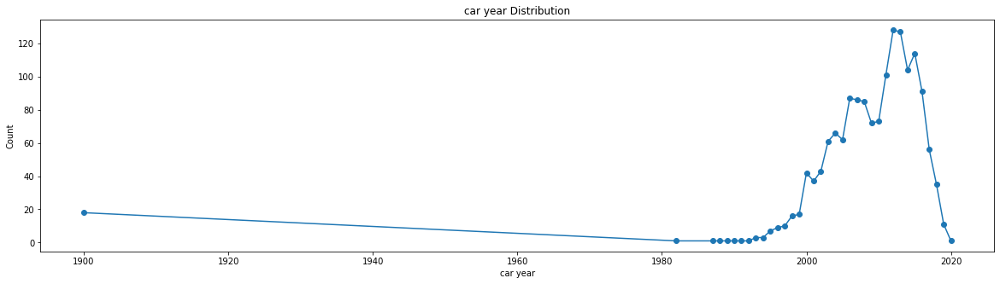

In [96]:
car_year = data["CLMT_VEH_YR"]
car_year_series = pd.Series(car_year)
plt.figure(figsize=(20,5))
car_year_counts = car_year_series.value_counts().sort_index()
plt.plot(car_year_counts.index, car_year_counts.values, '-o')
plt.xlabel("car year")
plt.ylabel("Count")
plt.title("car year Distribution")
plt.show()

In [104]:
#count how many money we can save for the insurance business
saved_money1 = data["age"]
li = []
def money(saved_money1):
    for x in saved_money1:
        if x != 0:
            li.append(x)
    return sum(li)
print(money(saved_money1))


67413


In [66]:
#1. STEP ONE: delete all the under age, in a eazy way, we suppose 14 here
data = data.drop(data[data["age"] < 14].index)
data

,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
0,0,YB85Q6L,1,2,2018-05-29,903.0,1522,991120685,NY,1960-06-22,Multi Veh - Unclear Liab,Closed with Payment,1,BURGANDY,"D/S FRONT FENDER, D",F-350 SUPE,2003,Automobile,Driver Front Corner,None,Below 10 mph,58
1,1,VUC6B3X,1,2,2016-11-28,0.0,10093,993950729,FL,1944-12-01,Multi Veh - Unclear Liab,Closed with Payment,2,BLACK,UNK REAR DMG,SONATA HYB,2016,Automobile,Complete Rear End,None,Parked or Stopped,72
2,6,EKICR4W,1,1,2018-05-10,156.0,75055,998685688,SC,1972-06-10,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,POI: D/S DOOR WON'T,200 LX,2016,Automobile,Driver Center,None,10-20 mph,46
3,12,Y9TIRJH,2,1,2019-12-11,0.0,5576,994335003,FL,1988-03-20,Multi Veh - Clear Liab,Closed without Payment,1,SILVER,NONE,COROLLA CE,2007,Automobile,No Damage,None,21-50 mph,31
4,16,YZKNJDD,1,3,2018-07-07,9129.0,13133,996569175,FL,1949-09-15,Multi Veh - Unclear Liab,Closed with Payment,2,BLUE,PRIMARY POINT OF DA,F-150 SUPE,2009,Automobile,Complete Front End,One,Unknown,69
5,25,X0STU9Z,4,2,2018-06-09,0.0,16298,997863143,PA,1948-08-02,Multi Veh - Unclear Liab,Closed with Payment,1,Silver,"FRONT BUMPER, GRILL",OUTBACK 3.,2011,Automobile,Complete Front End,None,Unknown,70
7,43,X8LZHG1,1,2,2015-06-29,521.0,82055,996167195,NY,1985-08-03,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE,PS REAR 1/4 PANEL W,TC,2005,Automobile,Complete Front End,More than one,21-50 mph,30
8,49,TKYJ2PM,1,1,2018-06-14,0.0,11930,992365054,IL,1985-03-16,Single Veh,Closed with Payment,2,BLUE,ENTIRE P/S AND FRON,YUKON SLE/,2003,Automobile,Complete Passenger Side,One,21-50 mph,33
9,51,910W8X5,1,1,2018-09-07,0.0,10536,994262222,ME,1948-08-06,Multi Veh - Unclear Liab,Closed with Payment,2,GRAY,"D/S FRNOT QP, HEADL",LEGACY 2.5,2012,Automobile,Driver Front Corner,None,10-20 mph,70
10,54,V03XJKM,2,2,2019-09-03,0.0,0,994691457,WI,1934-11-26,Multi Veh - Unclear Liab,Closed without Payment,0,GREEN,FRONT UNK,FOCUS ZX4,2007,Automobile,Complete Front End,Unknown,Unknown,85


/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


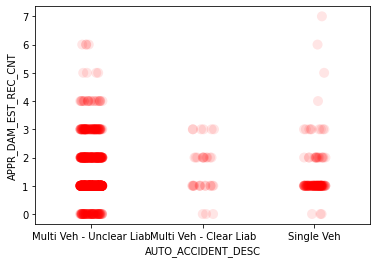

In [67]:
#check the liability 
#clear_liability = data[data["AUTO_ACCIDENT_DESC"] == "Multi Veh - Clear Liab"]
#clear_liability
#车的事故判定和检查次的关系
x = data["AUTO_ACCIDENT_DESC"]
y = data["APPR_DAM_EST_REC_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()


/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


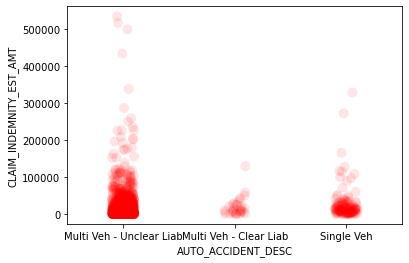

In [68]:
#车的事故判定和赔偿金额的关系
x = data["AUTO_ACCIDENT_DESC"]
y = data["CLAIM_INDEMNITY_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()


/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


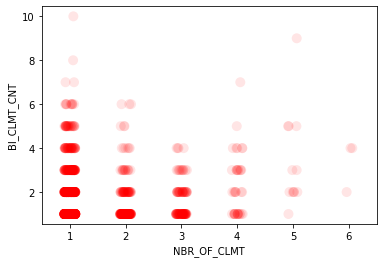

In [69]:
#claimants 和body injury的对比图
x = data["NBR_OF_CLMT"]
y = data["BI_CLMT_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


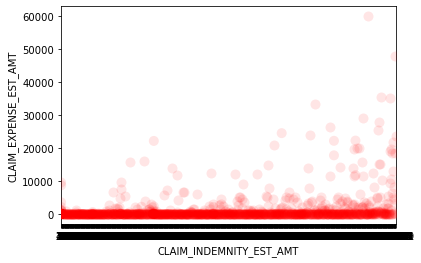

In [91]:
#调查费用和需要pay的费用
x = data["CLAIM_EXPENSE_EST_AMT"]
y = data["CLAIM_INDEMNITY_EST_AMT"]
sns.stripplot(y,x,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


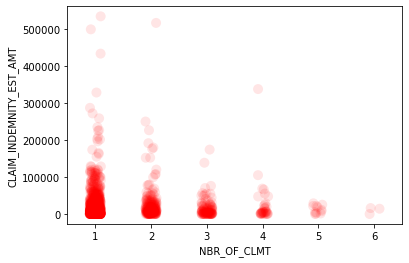

In [92]:
#Claimant 支付费用
x = data["NBR_OF_CLMT"]
y = data["CLAIM_INDEMNITY_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


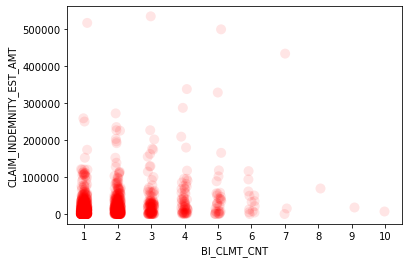

In [73]:
#body injury人数 与支付费用
x = data["BI_CLMT_CNT"]
y = data["CLAIM_INDEMNITY_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()


/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


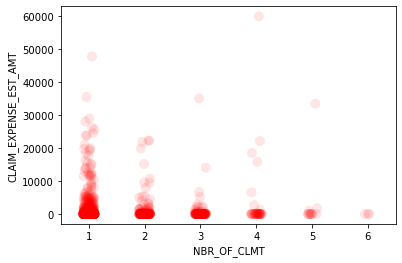

In [74]:
#Claimant 与调查费用
x = data["NBR_OF_CLMT"]
y = data["CLAIM_EXPENSE_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


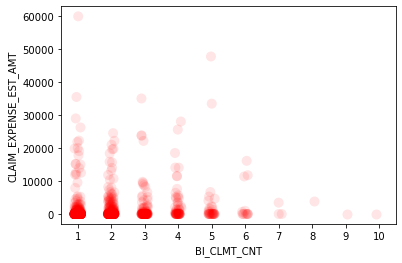

In [75]:
#Claimant和调查费用
x = data["BI_CLMT_CNT"]
y = data["CLAIM_EXPENSE_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


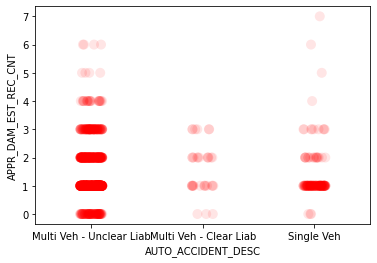

In [76]:
#事故状态 与 调查次数；
x = data["AUTO_ACCIDENT_DESC"]
y = data["APPR_DAM_EST_REC_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


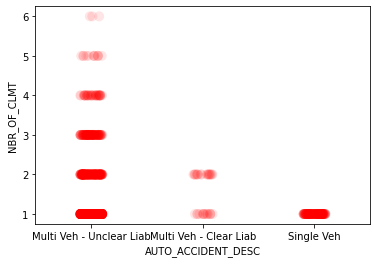

In [77]:
#事故状态 claiments
x = data["AUTO_ACCIDENT_DESC"]
y = data["NBR_OF_CLMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


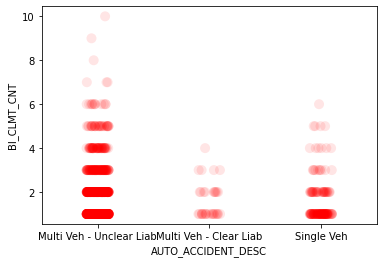

In [78]:
#事故状态 body injury
x = data["AUTO_ACCIDENT_DESC"]
y = data["BI_CLMT_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


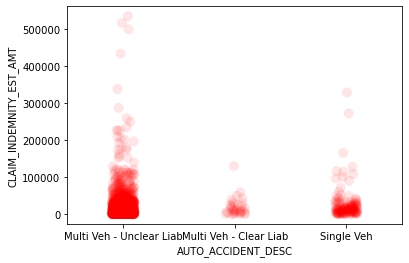

In [79]:
#事故状态 需要支付的费用
x = data["AUTO_ACCIDENT_DESC"]
y = data["CLAIM_INDEMNITY_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


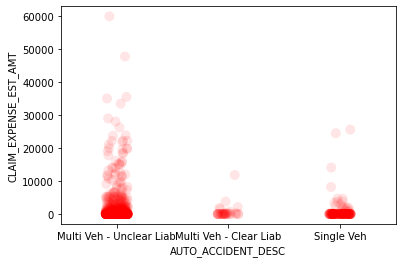

In [81]:
#事故状态和调查费用
x = data["AUTO_ACCIDENT_DESC"]
y = data["CLAIM_EXPENSE_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


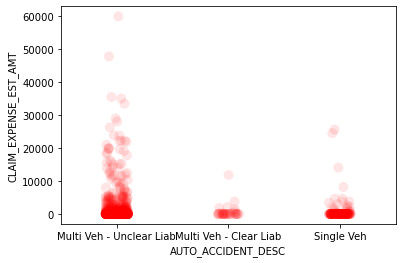

In [82]:
#事故状态和车检查次数
x = data["AUTO_ACCIDENT_DESC"]
y = data["CLAIM_EXPENSE_EST_AMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


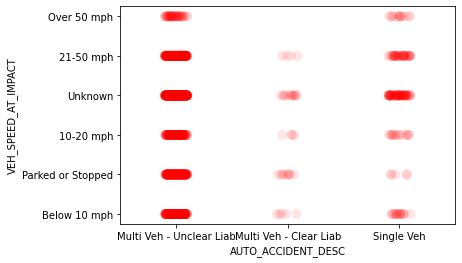

In [83]:
#事故状态和撞车状态
x = data["AUTO_ACCIDENT_DESC"]
y = data["VEH_SPEED_AT_IMPACT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


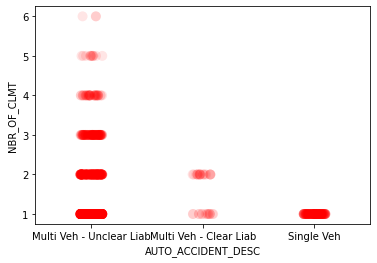

In [84]:
#事故状态和气囊展开个数
x = data["AUTO_ACCIDENT_DESC"]
y = data["NBR_OF_CLMT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


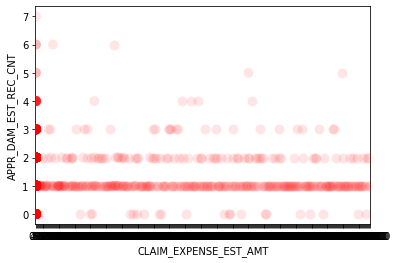

In [85]:
#调查费用和调查次数
x = data["CLAIM_EXPENSE_EST_AMT"]
y = data["APPR_DAM_EST_REC_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


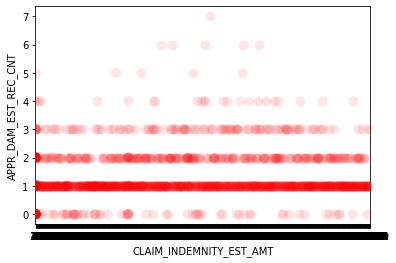

In [86]:
#支付费用和调查次数
x = data["CLAIM_INDEMNITY_EST_AMT"]
y = data["APPR_DAM_EST_REC_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


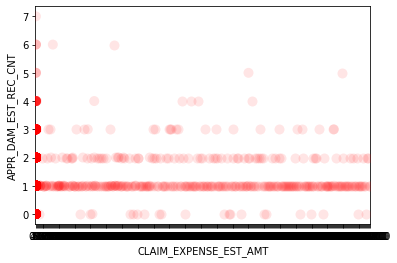

In [87]:
#调查费用和气囊个数
x = data["CLAIM_EXPENSE_EST_AMT"]
y = data["APPR_DAM_EST_REC_CNT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


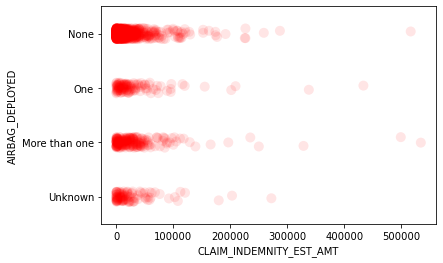

In [88]:
#支付费用和气囊个数
x = data["CLAIM_INDEMNITY_EST_AMT"]
y = data["AIRBAG_DEPLOYED"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


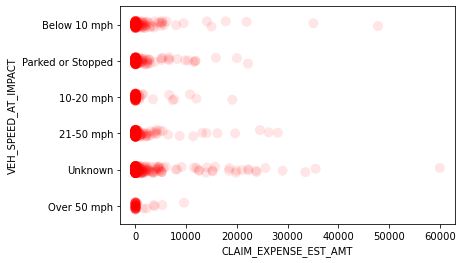

In [89]:
#调查费用和撞车姿态
x = data["CLAIM_EXPENSE_EST_AMT"]
y = data["VEH_SPEED_AT_IMPACT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


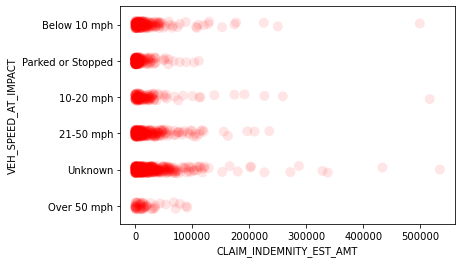

In [90]:
#支付费用和撞车姿态
x = data["CLAIM_INDEMNITY_EST_AMT"]
y = data["VEH_SPEED_AT_IMPACT"]
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

In [8]:
#STEP 2: delete all the clear liablity, we suppose the clear liability means all clear with 100% confidence 
data = data.drop(data[data["AUTO_ACCIDENT_DESC"] == "Multi Veh - Clear Liab"].index)
data

,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
0,0,YB85Q6L,1,2,2018-05-29,903.0,1522,991120685,NY,1960-06-22,Multi Veh - Unclear Liab,Closed with Payment,1,BURGANDY,"D/S FRONT FENDER, D",F-350 SUPE,2003,Automobile,Driver Front Corner,None,Below 10 mph,58
1,1,VUC6B3X,1,2,2016-11-28,0.0,10093,993950729,FL,1944-12-01,Multi Veh - Unclear Liab,Closed with Payment,2,BLACK,UNK REAR DMG,SONATA HYB,2016,Automobile,Complete Rear End,None,Parked or Stopped,72
2,6,EKICR4W,1,1,2018-05-10,156.0,75055,998685688,SC,1972-06-10,Multi Veh - Unclear Liab,Closed with Payment,1,BLACK,POI: D/S DOOR WON'T,200 LX,2016,Automobile,Driver Center,None,10-20 mph,46
4,16,YZKNJDD,1,3,2018-07-07,9129.0,13133,996569175,FL,1949-09-15,Multi Veh - Unclear Liab,Closed with Payment,2,BLUE,PRIMARY POINT OF DA,F-150 SUPE,2009,Automobile,Complete Front End,One,Unknown,69
5,25,X0STU9Z,4,2,2018-06-09,0.0,16298,997863143,PA,1948-08-02,Multi Veh - Unclear Liab,Closed with Payment,1,Silver,"FRONT BUMPER, GRILL",OUTBACK 3.,2011,Automobile,Complete Front End,None,Unknown,70
7,43,X8LZHG1,1,2,2015-06-29,521.0,82055,996167195,NY,1985-08-03,Multi Veh - Unclear Liab,Closed without Payment,1,WHITE,PS REAR 1/4 PANEL W,TC,2005,Automobile,Complete Front End,More than one,21-50 mph,30
8,49,TKYJ2PM,1,1,2018-06-14,0.0,11930,992365054,IL,1985-03-16,Single Veh,Closed with Payment,2,BLUE,ENTIRE P/S AND FRON,YUKON SLE/,2003,Automobile,Complete Passenger Side,One,21-50 mph,33
9,51,910W8X5,1,1,2018-09-07,0.0,10536,994262222,ME,1948-08-06,Multi Veh - Unclear Liab,Closed with Payment,2,GRAY,"D/S FRNOT QP, HEADL",LEGACY 2.5,2012,Automobile,Driver Front Corner,None,10-20 mph,70
10,54,V03XJKM,2,2,2019-09-03,0.0,0,994691457,WI,1934-11-26,Multi Veh - Unclear Liab,Closed without Payment,0,GREEN,FRONT UNK,FOCUS ZX4,2007,Automobile,Complete Front End,Unknown,Unknown,85
11,60,CI6GHKK,1,2,2015-11-11,24542.0,20000,997218452,SC,1998-08-02,Single Veh,Closed without Payment,1,Gray,POI: HOOD/RADIATOR/,GRAND CHER,1998,Automobile,Complete Front End,None,21-50 mph,17


In [9]:
length = len(data)
print(length)

1480


In [10]:
#check the type of veh_type. and identify the veh_type if related to fraud
car_type = data["VEH_TYPE"].value_counts()[:10]
print(car_type)

Automobile        1479
Specialty Auto       1
Name: VEH_TYPE, dtype: int64


In [11]:
# case number too small, can not use
car_special = data[data["VEH_TYPE"] == "Specialty Auto"]
car_special

,Unnamed: 0,CLM_NBR,NBR_OF_CLMT,BI_CLMT_CNT,COV_RGST_DT,CLAIM_EXPENSE_EST_AMT,CLAIM_INDEMNITY_EST_AMT,POL_NBR,POLICY_STATE,PRI_BTH_DT,AUTO_ACCIDENT_DESC,CLAIMANT_STATUS,APPR_DAM_EST_REC_CNT,VEH_COLR_TXT,VEH_DAM_TXT,CLMT_VEH_MDL_NM,CLMT_VEH_YR,VEH_TYPE,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT,age
251,1301,56ZB9OS,1,1,2014-06-16,0.0,0,994442616,20,1977-07-26,Single Veh,Closed with Payment,1,RED,DENT IN TANK BOTH D,FXDWG,2002,Specialty Auto,Passenger Center,None,21-50 mph,37


In [12]:
#check the data with NBR_OF_CLMT, BI_CLMT_CNT, APPR_DAM_EST_REC_CNT, VEH_PRIMARY_PT_OF_DAMAGE, AIRBAG_DEPLOYED, VEH_SPEED_AT_IMPACT
data = pd.DataFrame(data,columns = ["NBR_OF_CLMT", "BI_CLMT_CNT", "APPR_DAM_EST_REC_CNT", "VEH_PRIMARY_PT_OF_DAMAGE", "AIRBAG_DEPLOYED", "VEH_SPEED_AT_IMPACT"])
data


,NBR_OF_CLMT,BI_CLMT_CNT,APPR_DAM_EST_REC_CNT,VEH_PRIMARY_PT_OF_DAMAGE,AIRBAG_DEPLOYED,VEH_SPEED_AT_IMPACT
0,1,2,1,Driver Front Corner,None,Below 10 mph
1,1,2,2,Complete Rear End,None,Parked or Stopped
2,1,1,1,Driver Center,None,10-20 mph
4,1,3,2,Complete Front End,One,Unknown
5,4,2,1,Complete Front End,None,Unknown
7,1,2,1,Complete Front End,More than one,21-50 mph
8,1,1,2,Complete Passenger Side,One,21-50 mph
9,1,1,2,Driver Front Corner,None,10-20 mph
10,2,2,0,Complete Front End,Unknown,Unknown
11,1,2,1,Complete Front End,None,21-50 mph


/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


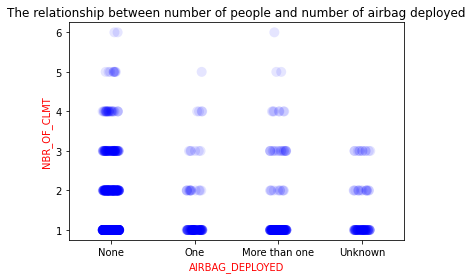

In [18]:
# scatterplot 1 for x-axis numb of people and y-axis numb of airbag deployed
x = data["NBR_OF_CLMT"]
y = data["AIRBAG_DEPLOYED"]
plt.title("The relationship between number of people and number of airbag deployed")
plt.ylabel("number of claiments", fontsize = 10, color = "r")
plt.xlabel("number of airbag deployed",fontsize = 10, color = "r")
#plt.scatter(y,x,s=30,alpha = 0.2)
sns.stripplot(y,x,jitter=True, color ="b",s =10, alpha = 0.1)

x = data["AIRBAG_DEPLOYED"]
y = data["VEH_SPEED_AT_IMPACT"]

plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


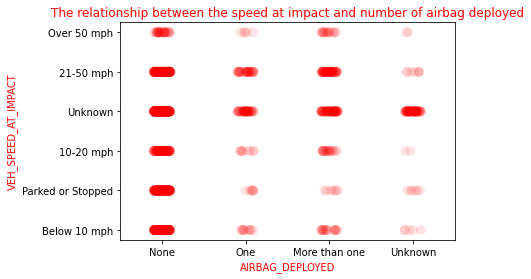

In [14]:
#scatterplot 2 for speed and airbag deployed. 
x = data["AIRBAG_DEPLOYED"]
y = data["VEH_SPEED_AT_IMPACT"]

plt.title("The relationship between the speed at impact and number of airbag deployed", color = "r")
plt.ylabel("speed at impact", fontsize = 10, color = "r")
plt.xlabel("number of airbag deployed",fontsize = 10, color = "r")
#plt.scatter(x,y,alpha = 0.1)
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


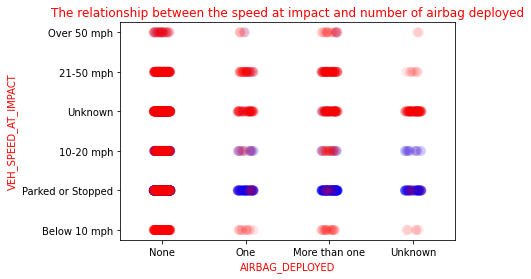

In [19]:
#part 1
x = data["NBR_OF_CLMT"]
y = data["AIRBAG_DEPLOYED"]
plt.title("The relationship between number of people and number of airbag deployed")
plt.ylabel("number of claiments", fontsize = 10, color = "r")
plt.xlabel("number of airbag deployed",fontsize = 10, color = "r")
#plt.scatter(y,x,s=30,alpha = 0.2)
sns.stripplot(y,x,jitter=True, color ="b",s =10, alpha = 0.1)

x = data["AIRBAG_DEPLOYED"]
y = data["VEH_SPEED_AT_IMPACT"]

x = data["AIRBAG_DEPLOYED"]
y = data["VEH_SPEED_AT_IMPACT"]

#part2
plt.title("The relationship between the speed at impact and number of airbag deployed", color = "r")
plt.ylabel("speed at impact", fontsize = 10, color = "r")
plt.xlabel("number of airbag deployed",fontsize = 10, color = "r")
#plt.scatter(x,y,alpha = 0.1)
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


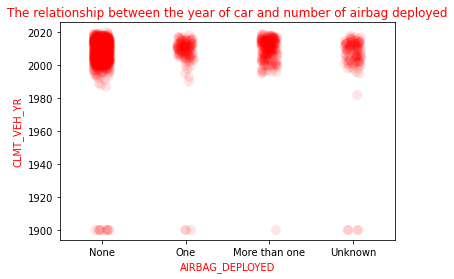

In [24]:
# the relationship bw the number of airbag deployed and year of the car 
x = data["AIRBAG_DEPLOYED"]
y = data["CLMT_VEH_YR"]
plt.title("The relationship between the year of car and number of airbag deployed", color = "r")
plt.ylabel("year of car", fontsize = 10, color = "r")
plt.xlabel("number of airbag deployed",fontsize = 10, color = "r")
#plt.scatter(x,y,alpha = 0.1)
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


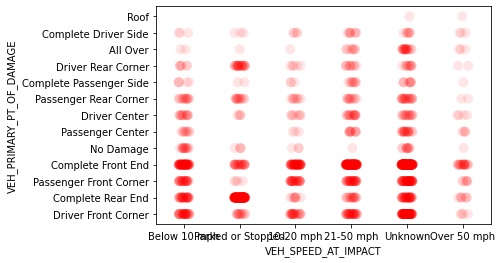

In [26]:
x = data["VEH_SPEED_AT_IMPACT"]
y = data["VEH_PRIMARY_PT_OF_DAMAGE"]

#plt.scatter(x,y,alpha = 0.1)
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()

/Users/chenghaolou/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


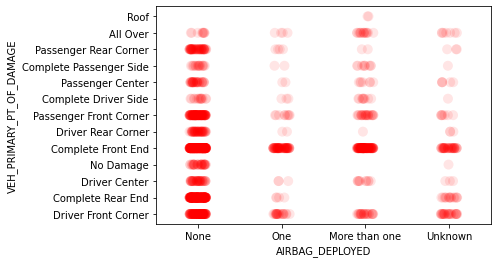

In [28]:
x = data["AIRBAG_DEPLOYED"]
y = data["VEH_PRIMARY_PT_OF_DAMAGE"]

#plt.scatter(x,y,alpha = 0.1)
sns.stripplot(x,y,jitter=True,color = "r",s = 10,alpha = 0.1)
plt.show()